In [1]:
import os

import numpy as np

import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from matplotlib.patches import Rectangle

import torch
import torch.nn as nn
import torch.nn.functional as F

import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")

import h5py

import models
import data
import inference
import masks


%load_ext autoreload
%autoreload 2

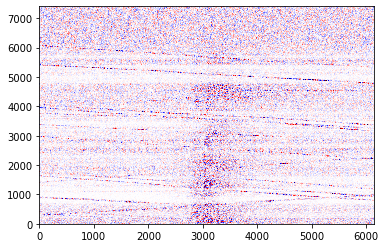

In [2]:
fs = 50.0

file = './data/preprocessed/real_test/2023p181489.h5'
idx = 6250
#indices = [6250,5250,5500,6250,6750,7250]

with h5py.File(file, 'r') as hf:
    samples = hf['DAS'][81:,idx-3072:idx+3072]

gutter = 1000
x = np.pad(samples[None,:], ((0,0),(0,0),(gutter,gutter)), mode='constant', constant_values=0)
x = data.bandpass(x, low=1.0, high=10.0, fs=fs, gutter=gutter)[0]
x = x / x.std(axis=-1, keepdims=True)

plt.imshow(x, origin='lower', interpolation='antialiased', cmap='seismic', aspect='auto', vmin=-1, vmax=1)

In [3]:
feature_maps = []

def hook_fn(module, input, output):
    feature_maps.append(output)
    
def plot_features(feature_map, width, height, vmin, vmax):
    num_filters = feature_map.shape[1]
    num_rows = num_filters // width

    fig, axes = plt.subplots(height, width, figsize=(4*width,2*height), layout='constrained')
    if not isinstance(axes, np.ndarray):
        axes = np.array([[axes]])
    for i in range(num_filters):
        row = i // width
        col = i % width
        im = axes[row, col].imshow(feature_map[0, i].cpu().detach().numpy(), origin='lower', interpolation='antialiased', cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
        axes[row, col].axis('off')

    fig.colorbar(im, ax=axes[:,width-1], location='right', shrink=1, aspect=40, pad=0.05)

    plt.show()
    
model = models.CN2SUNet(1, 1, hidden_ch=32, n_layers=4).to(device)
model.load_state_dict(torch.load('./ckpt/CN2S-finetuned4-complement-128x512-16x180_200.pt'))
model.eval();
for i in range(4):
    model.downs[i].convs.layers[7].register_forward_hook(hook_fn)
    
a = 1170
b = 2600
xx = torch.from_numpy(x[a:a+128,b:b+512]).to(device).float().unsqueeze(0).unsqueeze(0)

center = torch.tensor([[ 128//2,  512//2]])
nx_width = 16
mask, center_mask = masks.xmask(xx, center, nx_width=nx_width, dx=4)
mask = mask.to(device)

with torch.no_grad():
    out = model(mask*xx)

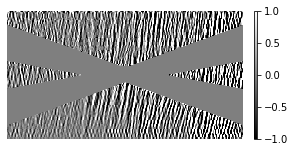

In [4]:
plot_features(mask*xx, 1, 1, vmin=-1, vmax=1)

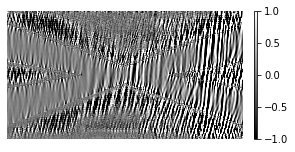

In [5]:
plot_features(out, 1, 1, vmin=-1, vmax=1)

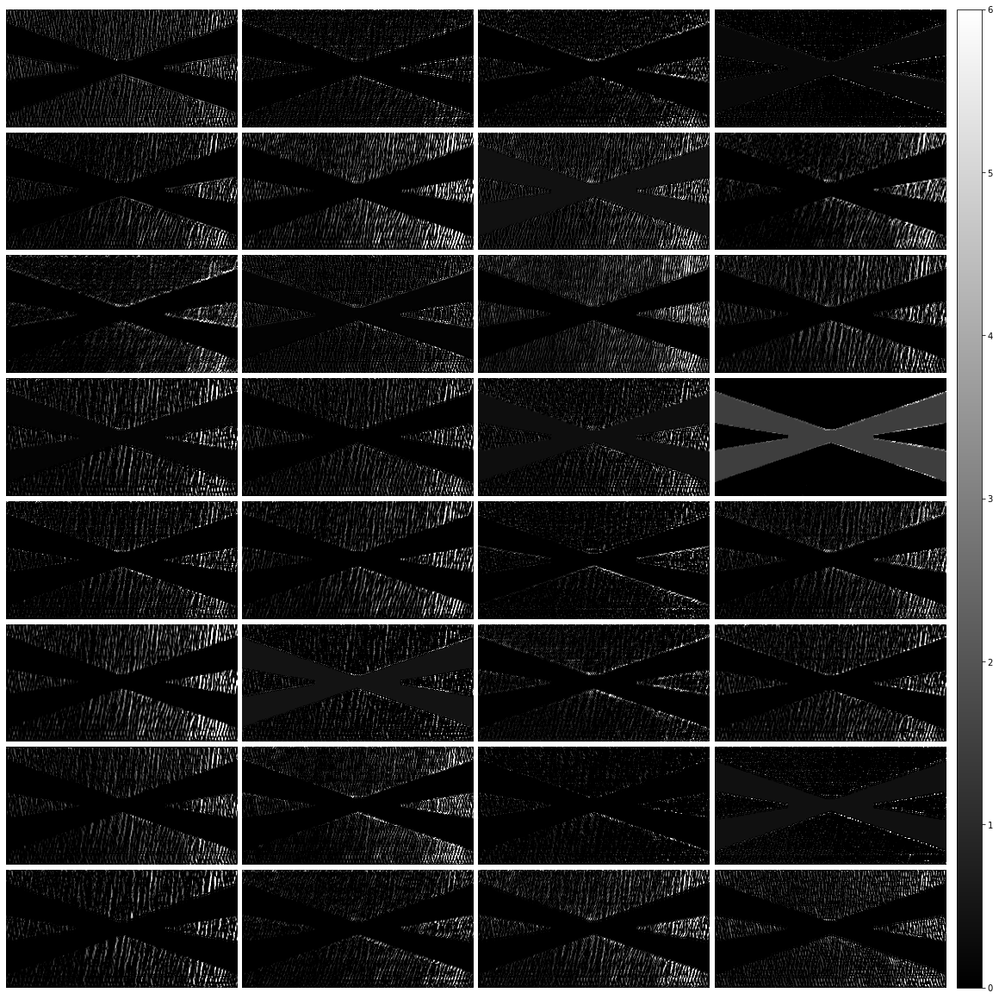

In [6]:
plot_features(feature_maps[0], 4, 8, vmin=0, vmax=6)

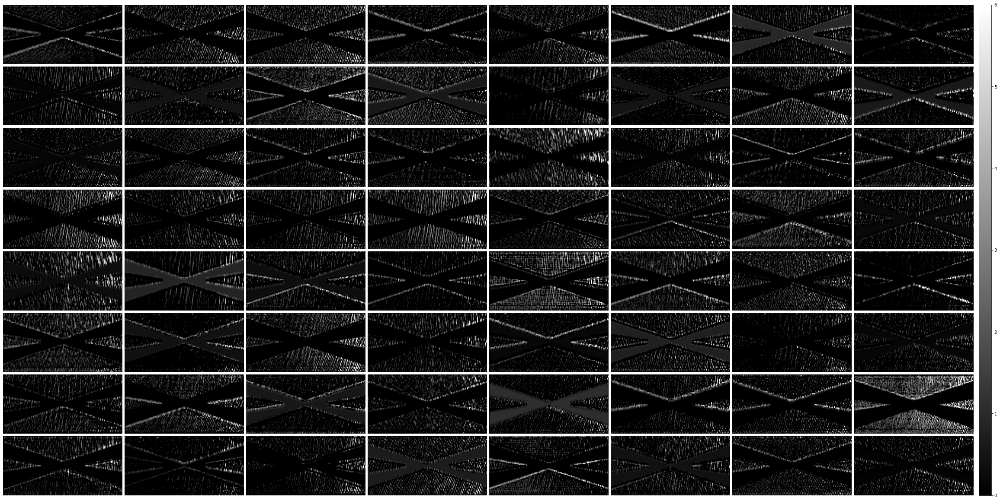

In [7]:
plot_features(feature_maps[1], 8, 8, vmin=0, vmax=6)

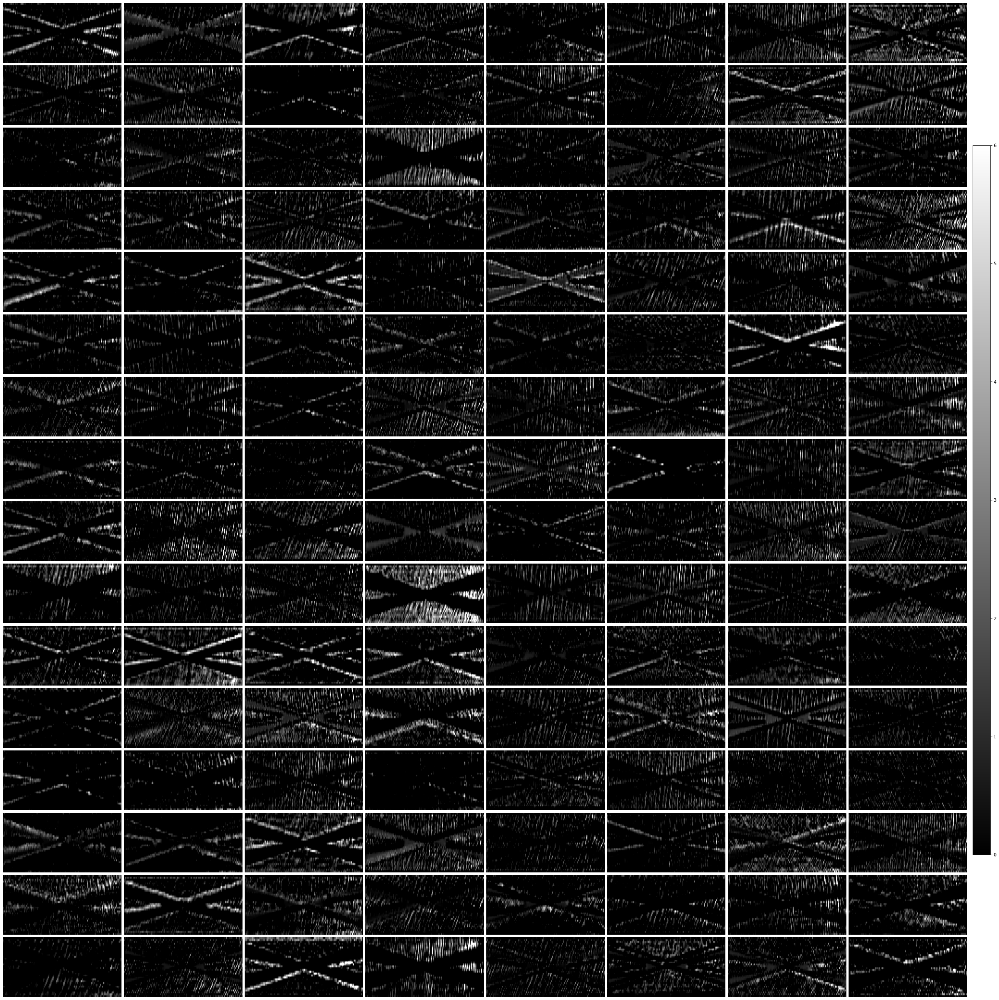

In [8]:
plot_features(feature_maps[2], 8, 16, vmin=0, vmax=6)

In [9]:
feature_maps = []

def hook_fn(module, input, output):
    feature_maps.append(output)

model = models.CN2SUNet(1, 1, hidden_ch=32, n_layers=4).to(device)
model.load_state_dict(torch.load('./ckpt/CN2S-finetuned4-complement-128x512-16x180_200.pt'))
model.eval();
for i in range(4):
    model.ups[i].upsample.register_forward_hook(hook_fn)

with torch.no_grad():
    out = model(mask*xx)

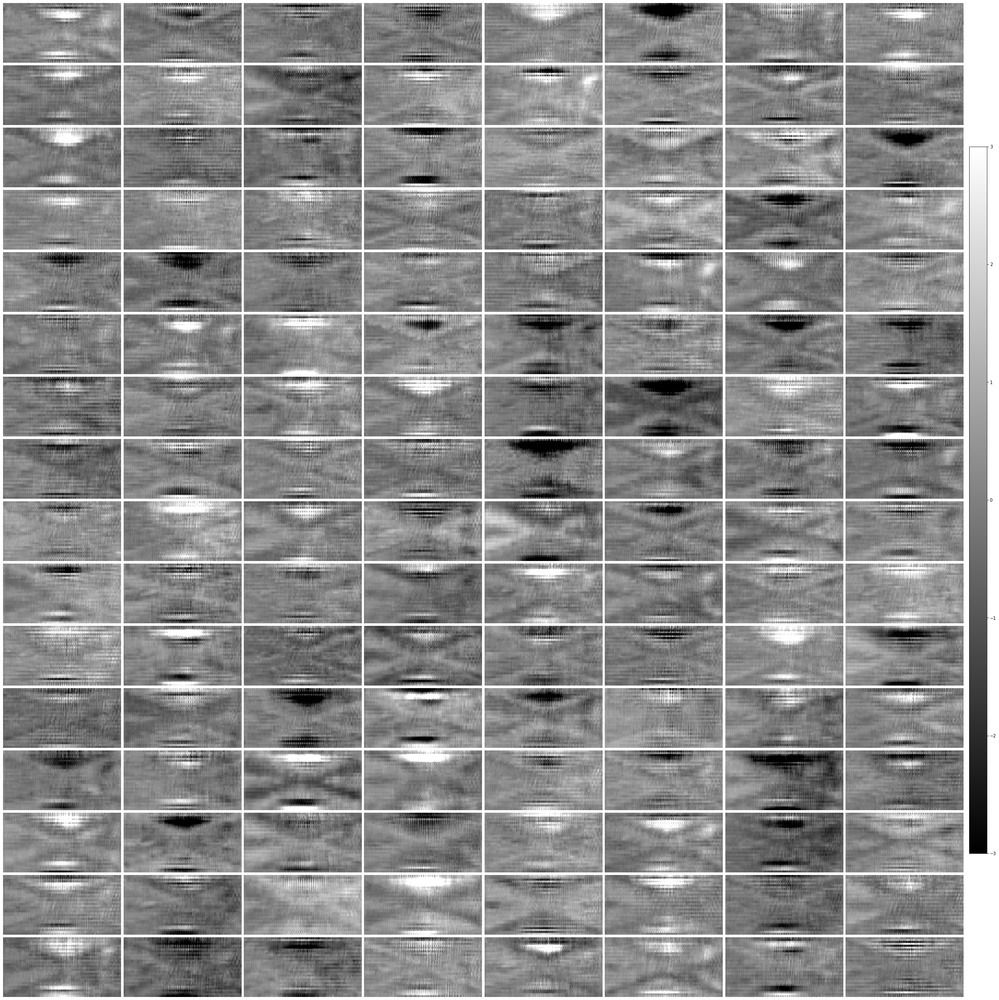

In [10]:
plot_features(feature_maps[1], 8, 16, vmin=-3, vmax=3)

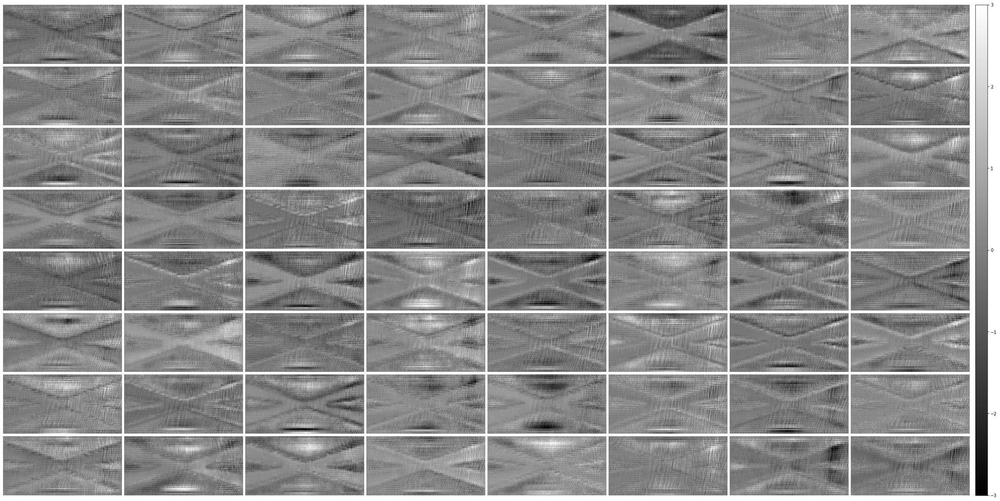

In [11]:
plot_features(feature_maps[2], 8, 8, vmin=-3, vmax=3)

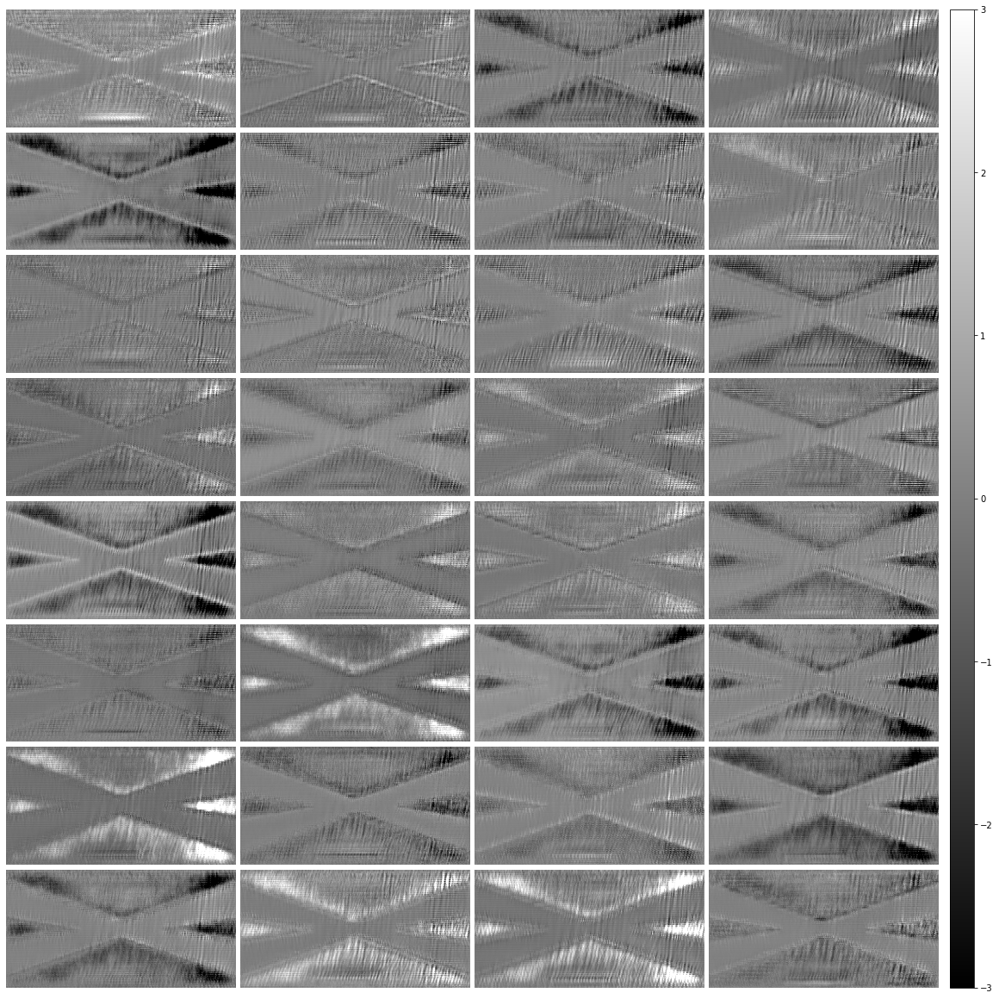

In [12]:
plot_features(feature_maps[3], 4, 8, vmin=-3, vmax=3)